# Árboles de decisión: Churn compañía de servicios de telefonía móvil

Vamos a aplicar un modelo de clasificación de árboles de decisión a un dataset que describe los clientes de una compañía que presta servicios de telefonía móvil que se han abandonado o no la compañía para irse a la competencia.

Importamos las librerías que vamos a utilizar

In [1]:
import numpy as np #operaciones matriciales y con vectores
import pandas as pd #tratamiento de datos
import matplotlib.pyplot as plt #gráficos
from sklearn import tree, datasets, metrics
#from sklearn import neighbors, datasets, metrics
from sklearn.model_selection import train_test_split #metodo de particionamiento de datasets para evaluación
from sklearn.model_selection import cross_val_score, cross_validate #método para evaluar varios particionamientos de C-V
from sklearn.model_selection import KFold, StratifiedKFold, RepeatedKFold, LeaveOneOut #Iteradores de C-V
import seaborn as sns
import math

## Entendimiento de los datos

Cargamos los datos para entenderlos

In [2]:
data = pd.read_csv('01_churn.csv', sep=';', na_values=".")
print(data.shape)
data.head(5)

(20000, 12)


,COLLEGE,INCOME,OVERAGE,LEFTOVER,HOUSE,HANDSET_PRICE,OVER_15MINS_CALLS_PER_MONTH,AVERAGE_CALL_DURATION,REPORTED_SATISFACTION,REPORTED_USAGE_LEVEL,CONSIDERING_CHANGE_OF_PLAN,LEAVE
0,zero,31953,0,6,313378,161,0,4,unsat,little,no,STAY
1,one,36147,0,13,800586,244,0,6,unsat,little,considering,STAY
2,one,27273,230,0,305049,201,16,15,unsat,very_little,perhaps,STAY
3,zero,120070,38,33,788235,780,3,2,unsat,very_high,considering,LEAVE
4,one,29215,208,85,224784,241,21,1,very_unsat,little,never_thought,STAY


**Parte 1**:
* Determine el número de registros, de variables, sus tipos ideales/reales, y sus rangos
* Determine el baseline (porcentaje clase mayoritaria)y su accuracy. ¿Están balanceados los datos (use diagrama de barras)?
* ¿Encuentran algún problema con los datos (missing values, datos inválidos, etc.)?
* Si fuésemos a utilizar K-NN, ¿debería hacerse algún pretratamiento de los datos?

El método **describe** permite obtener un dataframe con una descripción de las variables de un dataframe analizado. Para cada variable encontramos el número de registros validos (*count*).

Además, si se trata de una variable categórica, se puede obtener el número de clases posibles (*unique*), la clase mayoritaria (*top*) y la frecuencia de la clase mayoritaria (*freq*).

Y, si se trata de una variable numérica, se puede obtener el promedio (*mean*), desviación estándar (*std*), los valores mínimos (*min*) y máximos (*max*) y los cuartiles (*25%*, *50%* y *75%*).

In [3]:
data.tail()

,COLLEGE,INCOME,OVERAGE,LEFTOVER,HOUSE,HANDSET_PRICE,OVER_15MINS_CALLS_PER_MONTH,AVERAGE_CALL_DURATION,REPORTED_SATISFACTION,REPORTED_USAGE_LEVEL,CONSIDERING_CHANGE_OF_PLAN,LEAVE
19995,zero,153252,0,23,368403,597,1,6,very_sat,little,actively_looking_into_it,STAY
19996,one,107126,71,82,237397,609,5,2,very_sat,very_little,no,STAY
19997,zero,78529,0,66,172589,275,0,2,unsat,very_high,considering,LEAVE
19998,zero,78674,47,41,572406,288,4,2,very_unsat,little,considering,LEAVE
19999,zero,124697,0,0,845575,808,24,14,unsat,high,actively_looking_into_it,LEAVE


In [4]:
print(data.describe(include='all'))
print(data.dtypes)
print(data.info())

       COLLEGE         INCOME       OVERAGE      LEFTOVER          HOUSE  \
count    20000   20000.000000  20000.000000  20000.000000   20000.000000   
unique       2            NaN           NaN           NaN            NaN   
top        one            NaN           NaN           NaN            NaN   
freq     10048            NaN           NaN           NaN            NaN   
mean       NaN   80281.447750     85.979550     23.898650  493155.264250   
std        NaN   41680.586319     85.992324     26.816645  252407.884692   
min        NaN   20007.000000     -2.000000      0.000000  150002.000000   
25%        NaN   42217.000000      0.000000      0.000000  263714.250000   
50%        NaN   75366.500000     59.000000     14.000000  452259.500000   
75%        NaN  115881.750000    179.000000     41.000000  702378.000000   
max        NaN  159983.000000    335.000000     89.000000  999996.000000   

        HANDSET_PRICE  OVER_15MINS_CALLS_PER_MONTH  AVERAGE_CALL_DURATION  \
count    2

In [5]:
pd.crosstab(index=data["LEAVE"], columns="count")

col_0,count
LEAVE,
LEAVE,9852
STAY,10148


In [6]:
#Baseline sobre la variable objetivo
data['LEAVE'][data['LEAVE'] == 'STAY'].count()/data.shape[0]*100

50.739999999999995

<AxesSubplot:xlabel='LEAVE', ylabel='count'>

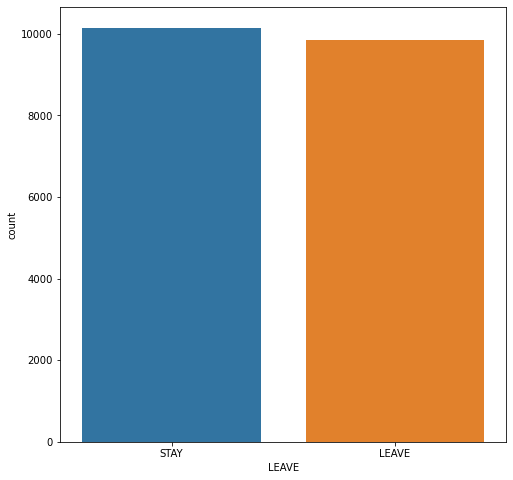

In [7]:
plt.figure(figsize=(8,8))
sns.countplot(x='LEAVE',data=data)

R//  Si fueramos a utiliar K-NN antes de entrenar el modelo, deberiamos escalar los datos. 

**Parte 2**:

Utilizando pandas y matplotlib, analice la distribución de las variables independientes con respecto a los valores de la variable objetivo LEAVE y STAY. Trate de encontrar patrones en plots univariados (densidad) y Bivariados (scatterplots) para las variables numéricas, y gráficos de barras de conteo para las categóricas.

In [8]:
var_indep_cat = ['COLLEGE', 'REPORTED_SATISFACTION', 'REPORTED_USAGE_LEVEL',
       'CONSIDERING_CHANGE_OF_PLAN', 'LEAVE']

In [9]:
var_indep_num = ['INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
                 'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION']

<AxesSubplot:xlabel='AVERAGE_CALL_DURATION', ylabel='Density'>

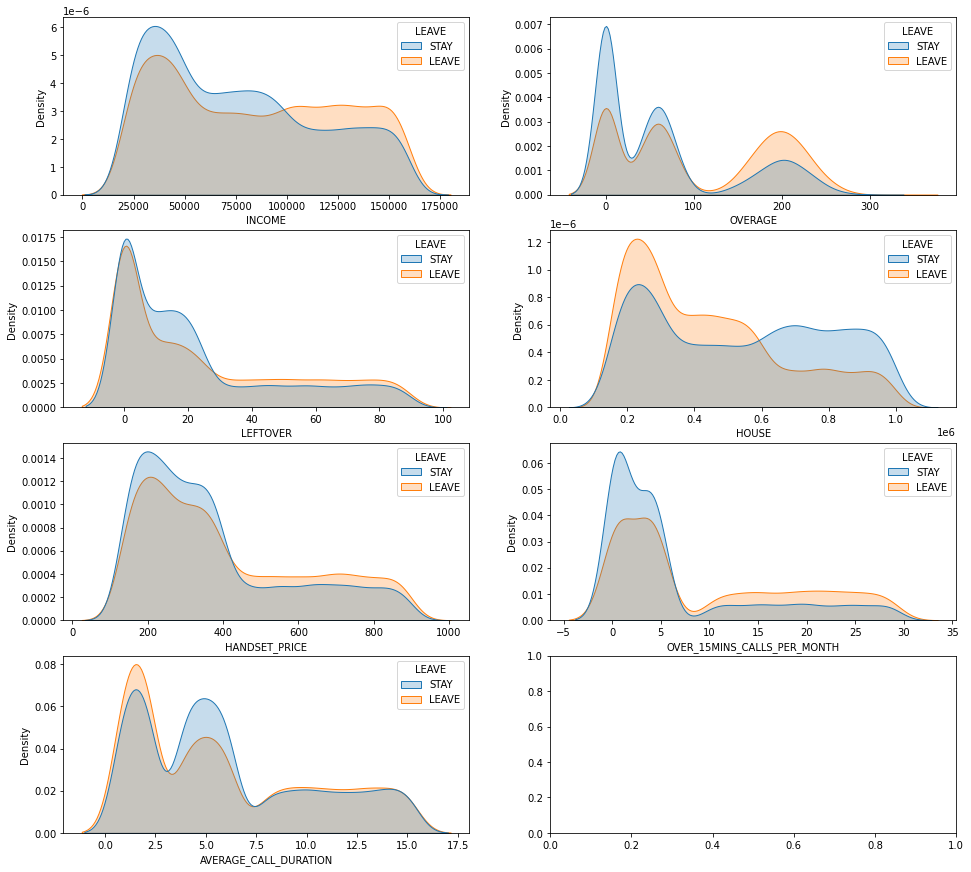

In [10]:
fig, axes = plt.subplots(4, 2, figsize=(16,15))
sns.kdeplot(data = data, x = 'INCOME', hue='LEAVE', ax=axes[0,0], fill = True)
sns.kdeplot(data = data, x = 'OVERAGE', hue='LEAVE',ax=axes[0,1], fill = True)
sns.kdeplot(data = data, x = 'LEFTOVER',  hue='LEAVE', ax=axes[1,0], fill = True)
sns.kdeplot(data = data, x = 'HOUSE',  hue='LEAVE', ax=axes[1,1], fill = True)
sns.kdeplot(data = data, x = 'HANDSET_PRICE', hue='LEAVE', ax=axes[2,0], fill = True)
sns.kdeplot(data = data, x = 'OVER_15MINS_CALLS_PER_MONTH', hue='LEAVE', ax=axes[2,1], fill = True)
sns.kdeplot(data = data, x = 'AVERAGE_CALL_DURATION',  hue='LEAVE', ax=axes[3,0], fill = True)

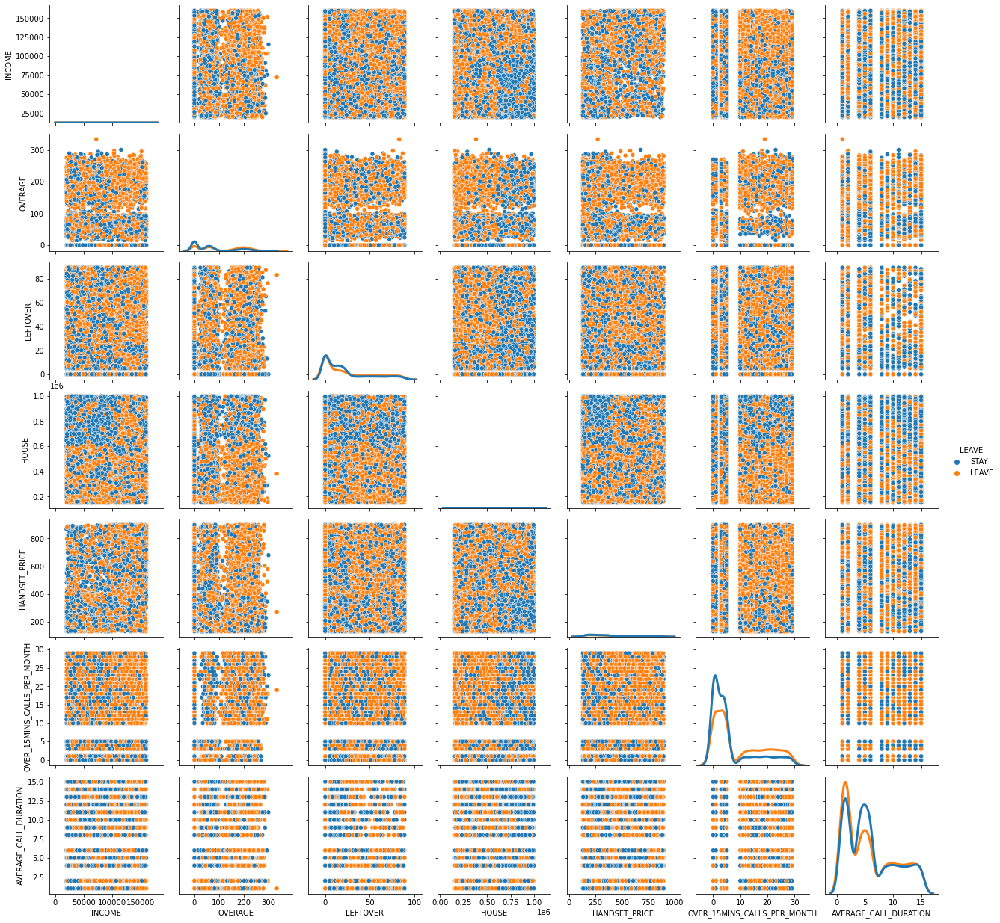

In [11]:
var_indep_num = ['INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
                 'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION', 'LEAVE']
g = sns.PairGrid(data[var_indep_num], hue="LEAVE")
g.map_offdiag(sns.scatterplot)
g.map_diag(sns.kdeplot, lw=3)
g.add_legend()

#jitter 

C:\Users\sebastian.giron\Anaconda3\lib\site-packages\pandas\core\generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


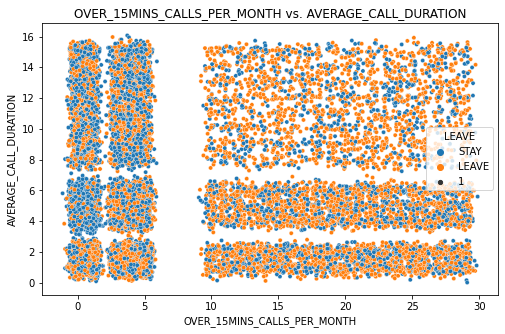

In [12]:

d2 = data[["OVER_15MINS_CALLS_PER_MONTH", "AVERAGE_CALL_DURATION", "LEAVE"]]
jitter = 0.3
d2.OVER_15MINS_CALLS_PER_MONTH = data.OVER_15MINS_CALLS_PER_MONTH + np.random.normal(scale=jitter, size=20000)
d2.AVERAGE_CALL_DURATION = data.AVERAGE_CALL_DURATION + np.random.normal(scale=jitter, size=20000)

fig = plt.figure(figsize=(18,5))
ax = fig.add_subplot(1, 2, 1)
sns.scatterplot(x="OVER_15MINS_CALLS_PER_MONTH", y="AVERAGE_CALL_DURATION", hue="LEAVE", data=d2, ax=ax, size=1)
plt.title("OVER_15MINS_CALLS_PER_MONTH vs. AVERAGE_CALL_DURATION")
plt.show()

# Clasificación a partir un árbol de decisión

Los árboles de decisión permiten utilizar tanto las variables predictivas categóricas como las numéricas.
No todas las variables van a ser útiles. El árbol se va a encargar de encontrar la mejor variable a utilizar en el contexto del subconjunto de datos de cada rama.

Veamos cómo se crea un árbol de decisión en scikit-learn, y algunos de los parámetros más importantes:

In [13]:
np.random.seed(1234)
ctree = tree.DecisionTreeClassifier(
    criterion='entropy', # el criterio de particionamiento de un conjunto de datos (gini, entropy)
    max_depth=None,      # prepoda: controla la profundidad del árbol (largo máximo de las ramas)
    min_samples_split=2, # prepoda: el mínimo número de registros necesarios para crear una nueva rama
    min_samples_leaf=1,  # prepoda: el mínimo número de registros en una hoja
    random_state=None,   # semilla del generador aleatorio utilizado para 
    max_leaf_nodes=None, # prepoda: máximo número de nodos hojas
    min_impurity_decrease=0.0, # prepoda: umbral mínimo de reducción de la impureza para aceptar la creación de una rama
    class_weight=None    # permite asociar pesos a las clases, en el caso de diferencias de importancia entre ellas
)

**Nota editorial**: scikit-learn soporta en sus árboles de decisión solamente variables independientes numéricas!!!!! Toca entonces utilizar un encoding (dummies). Realicelo para proceder a entrenar...

In [14]:
# no debe aparecer la variable objetivo
dataDummies = data.drop('LEAVE',axis=1)
dataDummies = pd.get_dummies(dataDummies)
dataDummies

,INCOME,OVERAGE,LEFTOVER,HOUSE,HANDSET_PRICE,OVER_15MINS_CALLS_PER_MONTH,AVERAGE_CALL_DURATION,COLLEGE_one,COLLEGE_zero,REPORTED_SATISFACTION_avg,...,REPORTED_USAGE_LEVEL_avg,REPORTED_USAGE_LEVEL_high,REPORTED_USAGE_LEVEL_little,REPORTED_USAGE_LEVEL_very_high,REPORTED_USAGE_LEVEL_very_little,CONSIDERING_CHANGE_OF_PLAN_actively_looking_into_it,CONSIDERING_CHANGE_OF_PLAN_considering,CONSIDERING_CHANGE_OF_PLAN_never_thought,CONSIDERING_CHANGE_OF_PLAN_no,CONSIDERING_CHANGE_OF_PLAN_perhaps
0,31953,0,6,313378,161,0,4,0,1,0,...,0,0,1,0,0,0,0,0,1,0
1,36147,0,13,800586,244,0,6,1,0,0,...,0,0,1,0,0,0,1,0,0,0
2,27273,230,0,305049,201,16,15,1,0,0,...,0,0,0,0,1,0,0,0,0,1
3,120070,38,33,788235,780,3,2,0,1,0,...,0,0,0,1,0,0,1,0,0,0
4,29215,208,85,224784,241,21,1,1,0,0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,153252,0,23,368403,597,1,6,0,1,0,...,0,0,1,0,0,1,0,0,0,0
19996,107126,71,82,237397,609,5,2,1,0,0,...,0,0,0,0,1,0,0,0,1,0
19997,78529,0,66,172589,275,0,2,0,1,0,...,0,0,0,1,0,0,1,0,0,0
19998,78674,47,41,572406,288,4,2,0,1,0,...,0,0,1,0,0,0,1,0,0,0


Quedarían 24 variables independientes.

In [15]:
#utilice el metodo train_test_split
from sklearn.model_selection import train_test_split #metodo de particionamiento de datasets para evaluación
X = dataDummies
y = data['LEAVE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [16]:
ctree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

Una vez el árbol es aprendido, se puede consultar diferentes atributos.
El mas interesante, aparte del árbol en sí, es el que asocia un índice de importancia a los atributos independientes en la clasificación (Traten de graficar un diagrama de barras con los pesos y las variables de mayor a menor):

In [17]:
ctree.feature_importances_

array([0.17027879, 0.15414993, 0.09012378, 0.19426336, 0.12234317,
       0.05660193, 0.04836696, 0.01105986, 0.00745421, 0.00926644,
       0.00532329, 0.00952153, 0.01004709, 0.01678175, 0.00440006,
       0.00848097, 0.01113406, 0.00959234, 0.01030889, 0.01203912,
       0.01191238, 0.00806119, 0.01109963, 0.00738927])

In [18]:
X.columns

Index(['INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION', 'COLLEGE_one',
       'COLLEGE_zero', 'REPORTED_SATISFACTION_avg',
       'REPORTED_SATISFACTION_sat', 'REPORTED_SATISFACTION_unsat',
       'REPORTED_SATISFACTION_very_sat', 'REPORTED_SATISFACTION_very_unsat',
       'REPORTED_USAGE_LEVEL_avg', 'REPORTED_USAGE_LEVEL_high',
       'REPORTED_USAGE_LEVEL_little', 'REPORTED_USAGE_LEVEL_very_high',
       'REPORTED_USAGE_LEVEL_very_little',
       'CONSIDERING_CHANGE_OF_PLAN_actively_looking_into_it',
       'CONSIDERING_CHANGE_OF_PLAN_considering',
       'CONSIDERING_CHANGE_OF_PLAN_never_thought',
       'CONSIDERING_CHANGE_OF_PLAN_no', 'CONSIDERING_CHANGE_OF_PLAN_perhaps'],
      dtype='object')

Encontramos entonces que las variables en orden de importancia son:

In [19]:
X.columns[np.argsort(-ctree.feature_importances_)]

Index(['HOUSE', 'INCOME', 'OVERAGE', 'HANDSET_PRICE', 'LEFTOVER',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION',
       'REPORTED_SATISFACTION_very_unsat',
       'CONSIDERING_CHANGE_OF_PLAN_actively_looking_into_it',
       'CONSIDERING_CHANGE_OF_PLAN_considering', 'REPORTED_USAGE_LEVEL_little',
       'CONSIDERING_CHANGE_OF_PLAN_no', 'COLLEGE_one',
       'REPORTED_USAGE_LEVEL_very_little', 'REPORTED_SATISFACTION_very_sat',
       'REPORTED_USAGE_LEVEL_very_high', 'REPORTED_SATISFACTION_unsat',
       'REPORTED_SATISFACTION_avg', 'REPORTED_USAGE_LEVEL_high',
       'CONSIDERING_CHANGE_OF_PLAN_never_thought', 'COLLEGE_zero',
       'CONSIDERING_CHANGE_OF_PLAN_perhaps', 'REPORTED_SATISFACTION_sat',
       'REPORTED_USAGE_LEVEL_avg'],
      dtype='object')

In [20]:
df = pd.DataFrame(list(zip(X.columns, ctree.feature_importances_)))
df.sort_values(by=1,ascending = False, inplace=True)
df

,0,1
3,HOUSE,0.194263
0,INCOME,0.170279
1,OVERAGE,0.154150
4,HANDSET_PRICE,0.122343
2,LEFTOVER,0.090124
5,OVER_15MINS_CALLS_PER_MONTH,0.056602
6,AVERAGE_CALL_DURATION,0.048367
13,REPORTED_SATISFACTION_very_unsat,0.016782
19,CONSIDERING_CHANGE_OF_PLAN_actively_looking_in...,0.012039
20,CONSIDERING_CHANGE_OF_PLAN_considering,0.011912


<AxesSubplot:xlabel='0', ylabel='1'>

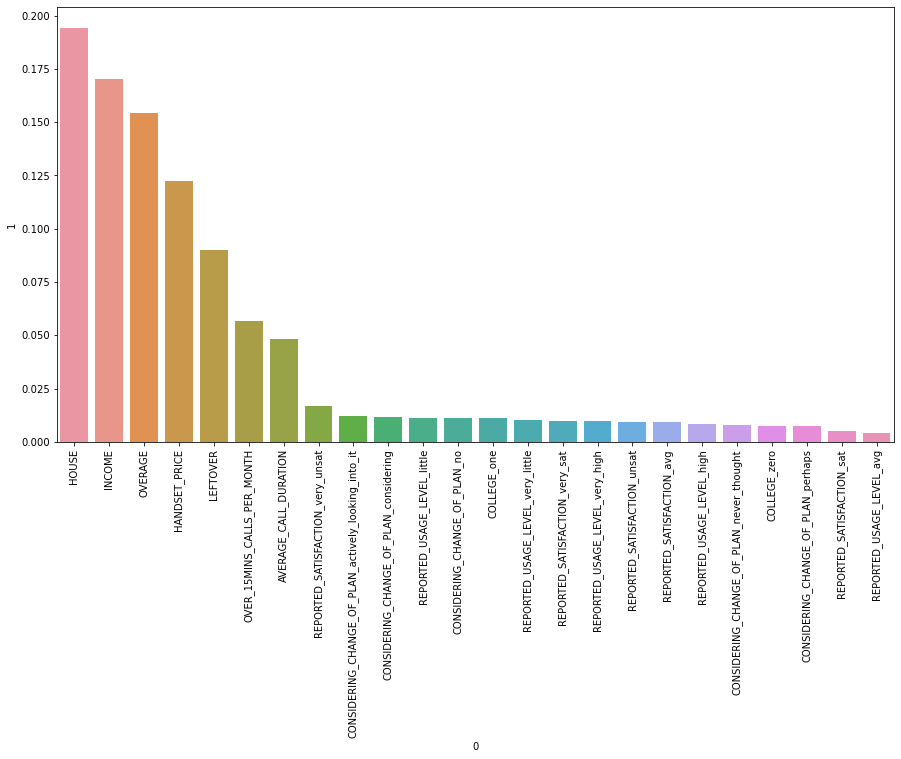

In [21]:
plt.figure(figsize = (15,8))
plt.xticks(rotation=90)
sns.barplot(x=0, y=1, data=df)

Vamos ahora a visualizar el árbol aprendido (para hacerlo, se necesita preinstalar la aplicación graphviz).

In [22]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [23]:
pip install pydotplus

Note: you may need to restart the kernel to use updated packages.


In [24]:
import pydotplus
from IPython.display import Image  
#from sklearn.externals.six import StringIO  
from six import StringIO

In [25]:
dot_data = StringIO()
tree.export_graphviz(ctree, 
                     filled=True, rounded=True,  #nodos redondeados y coloreados
                     class_names=ctree.classes_,
                     feature_names=X_train.columns,  
                     out_file=dot_data,
                     special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.259093 to fit



La imágen es demasiado grande para poder visualizarla aquí, vamos a guardarla un archivo y abrirla en un visor externo que permita hacer zoom.

In [26]:
# Create PNG
graph.write_png("arbol.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.259093 to fit



True

Como se puede ver el árbol es increiblemente grande y complejo, pues no se especificó ninguna manera de limitar su crecimiento.

## Evaluación del modelo

Ya tenemos el modelo "aprendido" con el dataset de 20000 instancias.
Vamos ahora a evaluarlo sobre ese mismo dataset para poder ver los éxitos y errores de la predicción. 

In [27]:
y_pred = ctree.predict(X_test)

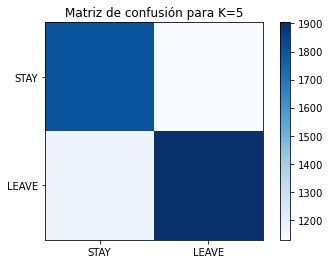

In [28]:
cm= metrics.confusion_matrix(y_test, y_pred)
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Matriz de confusión para K=5")
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, y_test.unique())
plt.yticks(tick_marks, y_test.unique())
plt.show()

In [29]:
print(cm)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))
print("Precisión     : ", metrics.precision_score(y_test, y_pred, "LEAVE", average='macro'))
print("Recall        : ", metrics.recall_score(y_test, y_pred, "LEAVE", average='macro'))
VN = np.sum(cm[1:3,1:3])
FP = np.sum(cm[0,1:3])
specificity = VN/(VN+FP)
print("Especificidad : ", specificity)
print("F1-score      : ", metrics.f1_score(y_test, y_pred, "LEAVE", average='macro'))


[[1801 1129]
 [1166 1904]]
Exactitud:  0.6175
Kappa    :  0.23480359959056163
Precisión     :  0.6173858703569799
Recall        :  0.6174356038287512
Especificidad :  0.6277612924497198
F1-score      :  0.617387246147066


C:\Users\sebastian.giron\Anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass labels=LEAVE as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "
C:\Users\sebastian.giron\Anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass labels=LEAVE as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "
C:\Users\sebastian.giron\Anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass labels=LEAVE as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


Con el árbol completo, obtuvimos un nivel de accuracy del 61.68%, cuando el baseline era de 50.74%.

## Overfitting: poda del árbol

Vamos a ver que hubiera pasado si limitamos el crecimiento del árbol (prepoda), controlando la profundidad del árbol y el mínimo número de registros de un nodo para permitir el particionamiento.

**Parte 3**:

Modifiquen el parámetro **criterion** y los parámetros de pre-poda buscando una mejor exactitud del modelo:
- **max_depth**: entre mas grande el valor, el árbol será más complejo (más número de niveles de profundidad)
- **min_samples_split**: entre mas grande el valor, el árbol será más sencillo (se necesita tener más registros en un nodo para poder particionarlo)
- **min_samples_leaf**: entre mas grande el valor, el árbol será más sencillo (se necesita tener más registros en una hoja para poder aceptarla, si no se llega a esa cardinalidad, no se permite el partionamiento de su nodo padre) 
- **min_impurity_decrease**: entre mas grande el valor, el árbol será más sencillo (un nivel de impureza bajo inferior a este umbral no desatará un particionamiento. 


In [30]:
np.random.seed(1234)
ctree = tree.DecisionTreeClassifier(
    criterion='entropy', # el criterio de particionamiento de un conjunto de datos
    max_depth=30,      # prepoda: controla la profundidad del árbol (largo máximo de las ramas)
    min_samples_split=20, # prepoda: el mínimo número de registros necesarios para crear una nueva rama
    min_samples_leaf=20,  # prepoda: el mínimo número de registros en una hoja
    random_state=None,   # semilla del generador aleatorio utilizado para 
    max_leaf_nodes=20, # prepoda: máximo número de nodos hojas
    min_impurity_decrease=0.0, # prepoda: umbral mínimo de reducción de la impureza para aceptar la creación de una rama
    class_weight='balanced'  # permite asociar pesos a las clases, en el caso de diferencias de importancia entre ellas
)
ctree.fit(X_train, y_train)



DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=30, max_leaf_nodes=20, min_samples_leaf=20,
                       min_samples_split=20)

In [31]:
y_pred = ctree.predict(X_test)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))

Exactitud:  0.6933333333333334


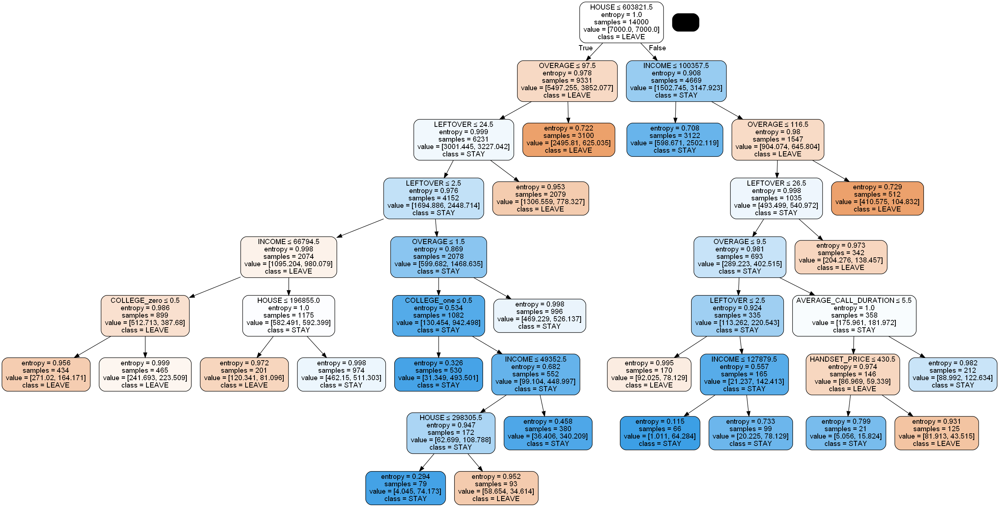

In [32]:
dot_data = StringIO()
tree.export_graphviz(ctree, 
                     filled=True, rounded=True,  #nodos redondeados y coloreados
                     class_names=ctree.classes_,
                     feature_names=X_train.columns,  
                     out_file=dot_data,
                     special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Podríamos seguir mejorando el árbol buscando un tuning de la prepoda mas complejo con los demás parámetros.

Podemos intentar con otro tipo de modelos, e.g KNN.

In [33]:
from sklearn.neighbors import KNeighborsClassifier
np.random.seed(1234)
knn = KNeighborsClassifier(n_neighbors=300)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
cm= metrics.confusion_matrix(y_test, y_pred)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))

Exactitud:  0.6286666666666667
Kappa    :  0.26520866359001205


También con un modelo Naive Bayes 

In [34]:
from sklearn.naive_bayes import GaussianNB
np.random.seed(1234)
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred = nb.predict(X_test)
cm= metrics.confusion_matrix(y_test, y_pred)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))

Exactitud:  0.6401666666666667
Kappa    :  0.2780930153242228


## Modelos de ensamble: bagging, random forest, boosting

## Bagging

Vamos ahora a crear un modelo de ensamble que utiliza muchos modelos de árboles sencillos que pone a votar para encontrar una decisión consensuada.

In [35]:
from sklearn.ensemble import BaggingClassifier
np.random.seed(1234)
ctree = tree.DecisionTreeClassifier(
    criterion='entropy', # el criterio de particionamiento de un conjunto de datos
    max_depth=7,      # prepoda: controla la profundidad del árbol (largo máximo de las ramas)
    min_samples_split=1000, # prepoda: el mínimo número de registros necesarios para crear una nueva rama
    min_samples_leaf=1,  # prepoda: el mínimo número de registros en una hoja
    random_state=None,   # semilla del generador aleatorio utilizado para 
    max_leaf_nodes=None, # prepoda: máximo número de nodos hojas
    min_impurity_decrease=0.0, # prepoda: umbral mínimo de reducción de la impureza para aceptar la creación de una rama
    class_weight=None    # permite asociar pesos a las clases, en el caso de diferencias de importancia entre ellas
)
bagging = BaggingClassifier(base_estimator = ctree,   # Por defecto un decision tree 
                            n_estimators=200,          # Número de modelos a crear
                            max_samples=0.7,          # Número o % de registros de la muestra de aprendizaje
                            max_features=0.7,         # Número o % de atributos de la muestra de aprendizaje
                            bootstrap=True,           # Utilizar reemplazo en el muestreo de los registros de aprendizaje
                            bootstrap_features=False, # Utilizar reemplazo en el muestreo de los atributos de aprendizaje
                            oob_score=False,          # Evaluar cada modelo con los registros no utilizados en su aprendizaje 
                            n_jobs=2,                 # Número de cores a utilizar
                            random_state=None,        # random seed para el generador aleatorio
                            verbose=0)                # controla la cantidad de información a reportar


In [36]:
bagging.fit(X_train, y_train)
y_pred = bagging.predict(X_test)
cm= metrics.confusion_matrix(y_test, y_pred)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))

Exactitud:  0.6965
Kappa    :  0.3946432073826269


Podemos hacer bagging de otro tipo de estimadores de base, por ejemplo KNN.

In [37]:
from sklearn.neighbors import KNeighborsClassifier
np.random.seed(1234)
bagging = BaggingClassifier(base_estimator = KNeighborsClassifier(),   # Por defecto un decision tree 
                            n_estimators=50,          # Número de modelos a crear
                            max_samples=0.5,          # Número o % de registros de la muestra de aprendizaje
                            max_features=0.5,         # Número o % de atributos de la muestra de aprendizaje
                            bootstrap=True,           # Utilizar reemplazo en el muestreo de los registros de aprendizaje
                            bootstrap_features=False, # Utilizar reemplazo en el muestreo de los atributos de aprendizaje
                            oob_score=False,          # Evaluar cada modelo con los registros no utilizados en su aprendizaje 
                            n_jobs=2,                 # Número de cores a utilizar
                            random_state=None,        # random seed para el generador aleatorio
                            verbose=0)                # controla la cantidad de información a reportar

bagging.fit(X_train, y_train)
y_pred = bagging.predict(X_test)
cm= metrics.confusion_matrix(y_test, y_pred)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))

Exactitud:  0.639
Kappa    :  0.2777415919918015


## Random Forest

In [38]:
from sklearn.ensemble import RandomForestClassifier
np.random.seed(1234)
rforest = RandomForestClassifier(n_estimators=100,     #Número de modelos a crear 
                                criterion='entropy', # el criterio de particionamiento de un conjunto de datos
                                max_depth=6,      # prepoda: controla la profundidad del árbol (largo máximo de las ramas)
                                min_samples_split=1000, # prepoda: el mínimo número de registros necesarios para crear una nueva rama
                                min_samples_leaf=1,  # prepoda: el mínimo número de registros en una hoja
                                max_features=('auto'), # Número o % de atributos de la muestra de aprendizaje
                                max_leaf_nodes=None, # prepoda: máximo número de nodos hojas
                                min_impurity_decrease=0.0, # prepoda: umbral mínimo de reducción de la impureza para aceptar la creación de una rama
                                bootstrap=True,      # Utilizar reemplazo en el muestreo de los registros de aprendizaje
                                oob_score=True,     # Evaluar cada modelo con los registros no utilizados en su aprendizaje 
                                n_jobs=2,            # Número de cores a utilizar
                                random_state=None,   # random seed para el generador aleatorio
                                verbose=0)           # controla la cantidad de información a reportar
rforest.fit(X_train, y_train)
y_pred = rforest.predict(X_test)
cm= metrics.confusion_matrix(y_test, y_pred)
print("Exactitud: ", metrics.accuracy_score(y_test, y_pred))
print("Kappa    : ", metrics.cohen_kappa_score(y_test, y_pred))

Exactitud:  0.6873333333333334
Kappa    :  0.37235274043640887


In [39]:
rforest.oob_score_

0.6952142857142857

Encontramos que las variables en orden de importancia son:

In [40]:
X.columns[np.argsort(-rforest.feature_importances_)]

Index(['HOUSE', 'OVERAGE', 'OVER_15MINS_CALLS_PER_MONTH', 'INCOME', 'LEFTOVER',
       'AVERAGE_CALL_DURATION', 'HANDSET_PRICE', 'COLLEGE_zero', 'COLLEGE_one',
       'REPORTED_SATISFACTION_very_sat',
       'CONSIDERING_CHANGE_OF_PLAN_considering', 'REPORTED_SATISFACTION_sat',
       'REPORTED_SATISFACTION_unsat', 'REPORTED_SATISFACTION_avg',
       'REPORTED_SATISFACTION_very_unsat',
       'CONSIDERING_CHANGE_OF_PLAN_perhaps', 'CONSIDERING_CHANGE_OF_PLAN_no',
       'REPORTED_USAGE_LEVEL_little', 'REPORTED_USAGE_LEVEL_avg',
       'REPORTED_USAGE_LEVEL_very_little', 'REPORTED_USAGE_LEVEL_very_high',
       'REPORTED_USAGE_LEVEL_high',
       'CONSIDERING_CHANGE_OF_PLAN_actively_looking_into_it',
       'CONSIDERING_CHANGE_OF_PLAN_never_thought'],
      dtype='object')

## Boosting

In [41]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import zero_one_loss
np.random.seed(1234)

numModelos = 400
ada_10 = AdaBoostClassifier(base_estimator=None,  #Por defecto se trata de decision stumps
                         n_estimators=numModelos,     #Número de modelos a crear
                         algorithm='SAMME',
                         learning_rate=1.0)    #Reduce la importancia de los modelos mas recientes
ada_10.fit(X_train, y_train)
ada_02 = AdaBoostClassifier(base_estimator=None,  #Por defecto se trata de decision stumps
                         n_estimators=numModelos,     #Número de modelos a crear
                        algorithm='SAMME',
                         learning_rate=0.2)    #Reduce la importancia de los modelos mas recientes

ada_02.fit(X_train, y_train)
ada_005 = AdaBoostClassifier(base_estimator=None,  #Por defecto se trata de decision stumps
                         n_estimators=numModelos,     #Número de modelos a crear
                         algorithm='SAMME',
                         learning_rate=0.05)    #Reduce la importancia de los modelos mas recientes
ada_005.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME', learning_rate=0.05, n_estimators=400)

In [42]:
ada_errores_test_10 = np.zeros((numModelos,))
for i, y_pred in enumerate(ada_10.staged_predict(X_test)):
    ada_errores_test_10[i] = 1-zero_one_loss(y_pred, y_test)
ada_errores_train_10 = np.zeros((numModelos,))
for i, y_pred in enumerate(ada_10.staged_predict(X_train)):
    ada_errores_train_10[i] = 1-zero_one_loss(y_pred, y_train)

In [43]:
ada_errores_test_02 = np.zeros((numModelos,))
for i, y_pred in enumerate(ada_02.staged_predict(X_test)):
    ada_errores_test_02[i] = 1-zero_one_loss(y_pred, y_test)
ada_errores_train_02 = np.zeros((numModelos,))
for i, y_pred in enumerate(ada_02.staged_predict(X_train)):
    ada_errores_train_02[i] = 1-zero_one_loss(y_pred, y_train)

In [44]:
ada_errores_test_005 = np.zeros((numModelos,))
for i, y_pred in enumerate(ada_005.staged_predict(X_test)):
    ada_errores_test_005[i] = 1-zero_one_loss(y_pred, y_test)

ada_errores_train_005 = np.zeros((numModelos,))
for i, y_pred in enumerate(ada_005.staged_predict(X_train)):
    ada_errores_train_005[i] = 1-zero_one_loss(y_pred, y_train)

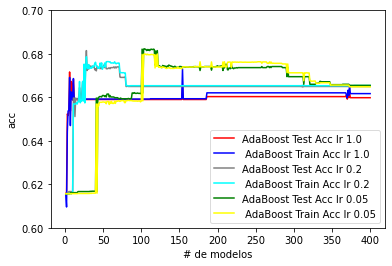

In [45]:
fig = plt.figure()
ax = fig.add_subplot(111)

ax.plot(np.arange(numModelos) + 1, ada_errores_test_10,
        label='AdaBoost Test Acc lr 1.0',
        color='red')
ax.plot(np.arange(numModelos) + 1, ada_errores_train_10,
        label=' AdaBoost Train Acc lr 1.0',
        color='blue')
ax.plot(np.arange(numModelos) + 1, ada_errores_test_02,
        label='AdaBoost Test Acc lr 0.2',
        color='gray')
ax.plot(np.arange(numModelos) + 1, ada_errores_train_02,
        label=' AdaBoost Train Acc lr 0.2',
        color='cyan')
ax.plot(np.arange(numModelos) + 1, ada_errores_test_005,
        label='AdaBoost Test Acc lr 0.05',
        color='green')
ax.plot(np.arange(numModelos) + 1, ada_errores_train_005,
        label=' AdaBoost Train Acc lr 0.05',
        color='yellow')

ax.set_ylim((0.6, 0.7))
ax.set_xlabel('# de modelos')
ax.set_ylabel('acc')

leg = ax.legend(loc='lower right', fancybox=True)
leg.get_frame().set_alpha(0.7)

plt.show()